# Nickel Reduction Walkthrough

This notebook provides a general overview of the __pipnick__ reduction process, laying out the steps involved in processing images taken with the Nickel telescope.

The general reduction steps are as follows:
1. Overscan Subtraction
2. Image Trimming
3. Bias Subtraction
4. Flat Correction
5. Cosmic Ray Removal

Each of these steps represents a phenomenon inherent to CCD camera photography that must be appropriately dealt with in order to clean an image. Following these steps will effectively isolate the light from astronomical sources (apart from noise, bias, and irregularities) in science images taken with the Nickel telescope. 

For each of these steps we will briefly describe the phenomenon at hand, providing definitions, methodologies, and visualizations.

The pipnick reduction pipeline follows a fairly standard reduction pipeline procedure. For a more detailed explanation of the definitions and methodologies behind each step, we recommend the user rerference [Astropy's CCD Reduction and Photometry Guide](https://www.astropy.org/ccd-reduction-and-photometry-guide/v/dev/notebooks/00-00-Preface.html), which this notebook is loosely based on.



## A.) Term Definitions

- **CCD (Charge-Coupled Device):** A semiconductor sensor composed of an array of light-sensitive pixels that converts incoming photons into electrons. These electrons are then transferred and read out to form a digital image, making CCDs essential for capturing astronomical and other high-quality images. The Nickel telescope relies on a CCD camera.

- **Overscan:** A non-illuminated region of the CCD readout used to measure and correct for electronic noise.

- **Trimming:** The process of removing overscan and other non-data areas to isolate the useful image.

- **Bias:** The constant electronic offset present in every CCD image, typically removed using bias frames.

- **Flats:** Calibration images of a uniformly lit field used to correct for pixel sensitivity variations and optical imperfections.

- **Cosmic Rays:** High-energy particles that strike the CCD, producing spurious bright spots or streaks that must be removed from the data.


## 0.) Notebook Setup

First, some logistics.

### 0.0.) Environment Setup

This notebook uses functions from the **pipnick** package – specifically it breaks down the steps involved in the *process_frame()* function in the **pipnick.piplines.reduction.py** module. The *process_frame()* function is the central function of the pipnick reduction pipeline, and implements the reduction steps listed above.

The **pipnick** package relies on functions from a wide variety of open source python libraries including, but not limited to **astropy**, **ccdproc**, and **numpy**. 

In order to run this notebook, the user should first build and install the **pipnick** package in the Python >=3.11 environment of their choice (i.e. conda, venv). 


### 0.0.) Environment Setup

This notebook uses functions from the **pipnick** package – specifically it breaks down the steps involved in the *process_frame()* function in the **pipnick.piplines.reduction.py** module. The *process_frame()* function is the central function of the pipnick reduction pipeline, and implements the reduction steps listed above.

The **pipnick** package relies on functions from a wide variety of open source python libraries including, but not limited to **astropy**, **ccdproc**, and **numpy**. 

In order to run this notebook, the user should first build and install the **pipnick** package in the Python >=3.11 environment of their choice (i.e. conda, venv). 

```python
$ (base) ~ ❯ conda activate pipnick-env
$ (pipnick-env) ~ ❯ cd {path to pipnick}
$ (pipnick-env) ~/{your path}/pipnick ❯ python -m pip install -e .
```

Now, using this environment as the kernel for this notebook, you should be able to directly import functions from the **pipnick** package. 

Lets import all the libraries and functions we'll need to run this notebook.

In [1]:
from pathlib import Path
import numpy as np
from astropy.io import fits
from astropy.nddata import CCDData
import matplotlib.pyplot as plt
import astropy.units as u
import ccdproc
# Import APLpy for plotting
import aplpy

# Import pipnick functions
from pipnick.pipelines.reduction import init_ccddata
from pipnick import cameras

from pipnick.utils import dir_nav
from pipnick.pipelines.reduction import process_frame
from pipnick.utils.display_fits import fits_plot, fits_plot_multi

print('Libraries imported.')

Libraries imported.



### 0.1.) Example Data

This notebook relies on a set of Nickel observations taken on 2024-06-24, which can be found [here](https://drive.google.com/drive/folders/10M69iegAT8Unl__ApMhWqX81lI9SzCjo). 

NOTE: Should we include this here? Data probably preloaded if we're hosting this somewhere...

A user should download the **raw** folder (containing fits files d1001.fits - d1062.fits), and save the folder in the **pipnick/notebooks/data/reduction_example/** directory. Raw images are simply images taken by the telescope CCD camera before being reduced.

Within the **pipnick/notebooks/data/reduction_example/** directory, there should also be empty directories **rdx/** and **tmp/**.

NOTE: While the reduction steps in this notebook should allow for the use of any full set of Nickel image data (bias, flats, science images), in order to standardize the flow of this notebook, we suggest using this same dataset.
With the **pipnick** package installed and example data saved in the **pipnick/notebooks/data/reduction_example/** directory, the rest of the notebook should be ready to run.



## 1.) Image Initialization

Lets take an initial look at the data we're going to be working with.

The **pipnick** package has a utility function, *build_metadata()* that we can use to build a table with metadata on the files in the **reduction_example/raw** directory.

### 1.0.) Metadata Table

In [2]:
# Defining our raw and rdx (reduced) directory paths, and the metadata table filename.
rawdir = './data/reduction_example/raw'
rdxdir = './data/reduction_example/rdx'
filename = './data/reduction_example/metadata_table.tbl'

# Organize raw files based on input directory or table
metafile, metadata = dir_nav.build_metadata(rawdir=rawdir, rdxdir=rdxdir, filename=filename, overwrite=True)

print(metafile)

metadata

/Users/dangause/Desktop/lick/nickel/pipnick/notebooks/data/reduction_example/metadata_table.tbl


file,frametype,object,filter,exptime,airmass,ra,dec,xbin,ybin,mode
str32,str32,str32,str32,str32,str32,str32,str32,str32,str32,str32
d1001.fits,skyflat,Flat,B,3,1.35322701931,14:01:59.45,-5:05:53.4,-2,-2,80
d1002.fits,skyflat,Flat,B,3,1.35322701931,14:02:39.62,-5:05:54.1,-2,-2,80
d1003.fits,skyflat,Flat,B,3,1.35322701931,14:03:24.73,-5:05:54.9,-2,-2,80
d1004.fits,skyflat,Flat,B,3,1.35322701931,14:04:04.91,-5:05:55.7,-2,-2,80
d1005.fits,skyflat,Flat,V,3,1.35322701931,14:04:55.19,-5:05:56.6,-2,-2,80
d1006.fits,skyflat,Flat,V,7,1.35322701931,14:06:05.44,-5:05:57.8,-2,-2,80
d1007.fits,skyflat,Flat,V,7,1.35322701931,14:06:55.61,-5:05:58.8,-2,-2,80
d1008.fits,skyflat,Flat,V,7,1.35322701931,14:07:45.89,-5:05:59.7,-2,-2,80
d1009.fits,skyflat,Flat,R,7,1.35322701931,14:08:46.03,-5:06:00.8,-2,-2,80


In [3]:
metadata.meta

OrderedDict([('rawdir',
              '/Users/dangause/Desktop/lick/nickel/pipnick/notebooks/data/reduction_example/raw'),
             ('rdxdir',
              '/Users/dangause/Desktop/lick/nickel/pipnick/notebooks/data/reduction_example/rdx')])

In our metadata table, we see a row for each fits file in our **data/reduction_example/raw/** directory. 

Lets also check out the **frametype**, **object**, and **filter** columns.

In [4]:
unique_frametype_values = {str(item) for item in metadata['frametype']}
print('Unique frametype values: ', unique_frametype_values)

unique_object_values = {str(item) for item in metadata['object']}
print('Unique object values: ', unique_object_values)

unique_filter_values = {str(item) for item in metadata['filter']}
print('Unique filter values: ', unique_filter_values)

unique_exptime_values = {str(item) for item in metadata['exptime']}
print('Unique exptime values: ', unique_exptime_values)

Unique frametype values:  {'None', 'skyflat', 'bias'}
Unique object values:  {'Flat', 'Focusing14', 'Post-ievent recovery. Test bias.', 'Point', 'Focusing18', 'Bias', '109_231', 'NGC_3982', '109_199', 'PG1530+057'}
Unique filter values:  {'I', 'R', 'B', 'V'}
Unique exptime values:  {'5', '0', '7', '120', '60', '10', '9', '3', '15', '20', '70', '12', '30'}


We can see that the frametype column breaks images into `{'skyflat', 'None', 'bias'}` categories. Here, `None` signifies a science image.

The object column gives us some additional information into what the image contains, naming specific target objects for science images.

From the filter column, we see the filters B, V, R, and I – the four filters which compromise the standard BVRI photometric filter set.

Finally, we see exptime (exposure time) values ranging from 0 to 120 (seconds). 
**In this notebook, we will use the galaxy **NGC_3982** as our reduction example.**


> From Wikipedia: "NGC 3982 (also known as UGC 6918) is an intermediate spiral galaxy approximately 68 million light-years away in the constellation Ursa Major. ... NGC 3982 is a part of the M109 Group.
At an apparent magnitude of 12.0, NGC 3982 needs a telescope to be viewed. Using small telescopes, the galaxy appears as a very faint, diffuse patch of light, with its central region appearing as a slightly brighter diffuse ball.
NGC 3982 is a Seyfert 2 galaxy that spans about 30,000 light-years, about one-third of the size of our Milky Way galaxy. ... The galaxy is a typical spiral galaxy, similar to our Milky Way."

Let's look at the metadata for **NGC_3982**.

In [5]:
metadata[metadata['file'] == 'd1032.fits']

file,frametype,object,filter,exptime,airmass,ra,dec,xbin,ybin,mode
str32,str32,str32,str32,str32,str32,str32,str32,str32,str32,str32
d1032.fits,None,NGC_3982,B,120,1.281367778778,11:56:28.09,55:07:31.0,-2,-2,80


We can see that the image taken of **NGC_3982** used the B filter, and had an exposure time of 120s. We'll use this information later in the reduction process.

We are now ready to initialize the CCD image for **NGC_3982**.

### 1.1.) Initialization
Now let's read the raw FITS file, and load it into a CCDData object using the **pipnick.pipelines.reduction** helper function, *init_ccddata()*.


In [6]:
# Specify the raw science file (adjust the path as needed)
raw_file = './data/reduction_example/raw/d1032.fits'

# Initialize the CCDData object with camera-specific settings
ccd = init_ccddata(raw_file)
print('ccd type: ', type(ccd))
ccd

ccd type:  <class 'astropy.nddata.ccddata.CCDData'>


CCDData([[   ———,    ———,    ———, ..., 1668.6, 1666.8, 1672.2],
         [   ———,    ———,    ———, ..., 1665. , 1668.6, 1659.6],
         [   ———,    ———,    ———, ..., 1663.2, 1672.2, 1670.4],
         ...,
         [   ———,    ———,    ———, ..., 1639.8, 1650.6, 1654.2],
         [   ———,    ———,    ———, ..., 1641.6, 1636.2, 1645.2],
         [   ———,    ———,    ———, ..., 1621.8, 1630.8, 1620. ]], unit='electron')

The initialized ccd object is of the **astropy.nddata.ccddata.CCDData** class.

In essence, it's just a $n x m$ numpy array with a unit attached to it. In the case of CCDData objects, this unit is electrons.

Lets view the image using the **APLpy** library's *FITSFigure()* plotting function, which will frame the plot with WCS coordinates.


INFO: Auto-setting vmin to  8.566e+02 [aplpy.core]
INFO: Auto-setting vmax to  1.624e+03 [aplpy.core]
Camera used: NickelC2
DATASEC: [1:1024,1:1024]


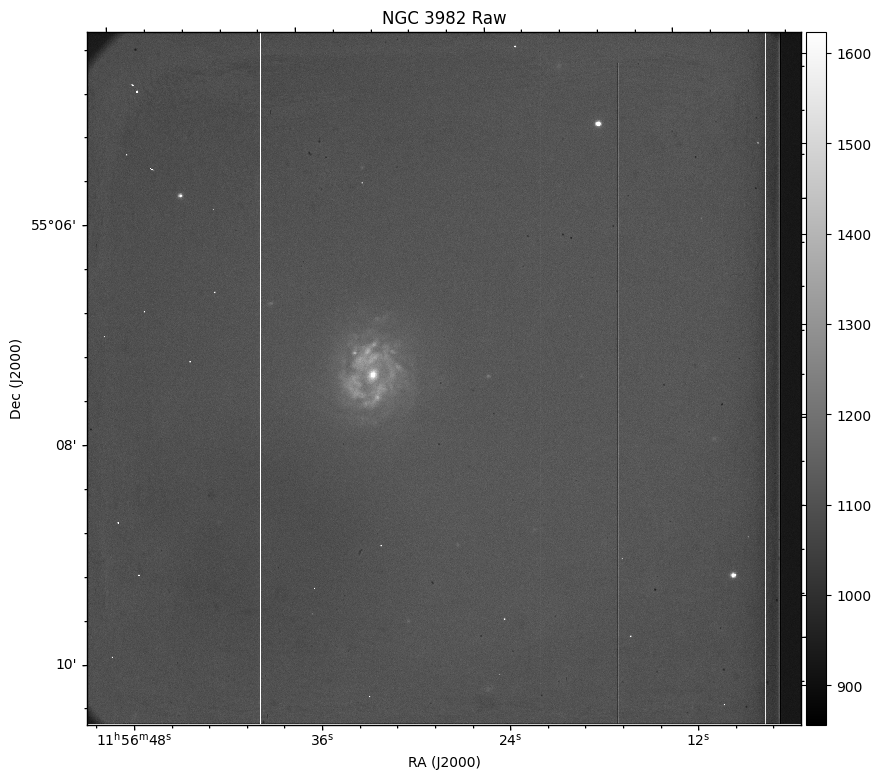

In [7]:
# Use APLpy to display the image
fig = aplpy.FITSFigure(raw_file, convention='pixel')
fig.show_colorscale(cmap='gray')
fig.add_colorbar()
fig.set_title('NGC 3982 Raw')

print('Camera used:', ccd.meta.get('camera', 'Unknown'))
print('DATASEC:', ccd.header.get('DATASEC', 'Not Found'))

Since we care more about the pixel coordinates than the WCS coordinates, from now on we'll just use matplotlib.pyplot for our visualizations.


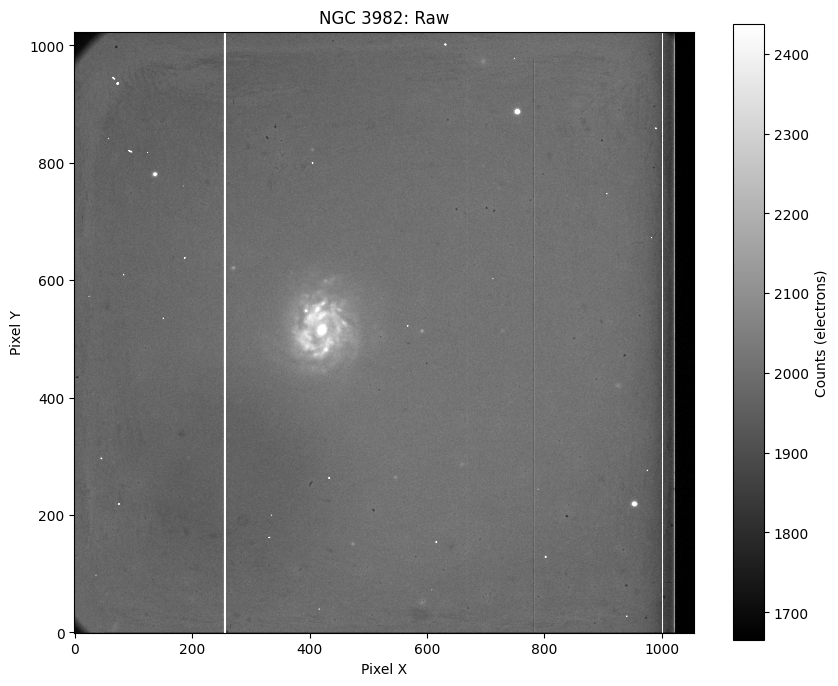

In [45]:
fits_plot(ccd, title='NGC 3982: Raw',
          xlabel='Pixel X', ylabel='Pixel Y', cmap='gray', cbar_label='Counts (electrons)',
          figsize=(10, 10), vmax=99.75)



There's a lot to see here! Lets break it down visually into the good, the bad, and the ugly.

**First, the good.**

The target object, **NGC 3982** is clear and slightly left of center. We can easily identify it as a spiral galaxy, and it's tight and bright core is characteristic of a Seyfert II galaxy.

We can also see what look like some other astronomical point sources, presumably stars, scattered around the image. 

**Now, the bad (and the ugly).**

There's a lot going on aside from the astronomical sources. Here's an inexhuastive list:
- clear vignettes on the upper and lower left corners
- 2 bright vertical bars (~x=250p and ~x=1000p)
- one darker vertical bar (~x=790, ~0p≤y≤950p)
- a dark column (~y≥1020p)
- some dark flecks scattered around
- general fading in spots
- bright pixels that don't appear to be associated with astronomical sources.

All of these are either artifacts of the telescope lens and camera, or unwanted signals from the observed night sky.

The rest of this notebook will outline the steps necessary to deal with these imperfections, with the goal of isolating the astronomical objects we're actually interested in studying.

## 2.) Overscan Subtraction and Trimming
The overscan is a deliberately included region on a CCD that isn’t exposed to light. Instead, it records the electronic bias—essentially the inherent noise added during the CCD's readout process. Since this bias can fluctuate over time or across the chip, we use the overscan region to measure its level for each image.

The standard approach is to average the pixel values from the overscan area and then subtract that value (or a varying bias profile if needed) from the corresponding sections of the actual image. This correction is crucial for ensuring that the resulting image data accurately reflect the true light signal, paving the way for further calibrations like bias, dark, and flat-field corrections.

By looking at our raw science image, it appears that there is an overscan region on the far right side of the image.
Now let's take a look at the header of our fits file of NGC 3982. This will tell us some important information about the specs of the telescope and camera at the time of image capture.


In [9]:
ccd.header

SIMPLE  =                    T / NORMAL FITS IMAGE                              
BITPIX  =                   16 / DATA PRECISION                                 
NAXIS   =                    2 / NUMBER OF IMAGE DIMENSIONS                     
NAXIS1  =                 1056 / NUMBER OF COLUMNS                              
NAXIS2  =                 1024 / NUMBER OF ROWS                                 
CRVAL1U =                 2048 / COLUMN ORIGIN                                  
CRVAL2U =                 2048 / ROW ORIGIN                                     
CDELT1U =                   -2 / COLUMN CHANGE PER PIXEL                        
CDELT2U =                   -2 / ROW CHANGE PER PIXEL                           
OBSNUM  =                 1032 / OBSERVATION NUMBER                             
IDNUM   =                    1 / IMAGE ID                                       
UGEOM   =                    0 / UCAM READOUT GEOMETRY                          
DGEOM   =                   

Let's verify which camera our image was taken with.


In [72]:
print('Nickel camera used: ', ccd.meta["camera"])
print('Number of columns (pixels) in image: ', ccd.meta["NAXIS1"])
print('Number of rows (pixels) in image: ', ccd.meta["NAXIS2"])
print('Number of overscan columns (pixels): ', ccd.meta["COVER"])
print('Science data image region: ', ccd.meta["DATASEC"])

Nickel camera used:  NickelC2
Number of columns (pixels) in image:  1056
Number of rows (pixels) in image:  1024
Number of overscan columns (pixels):  32
Science data image region:  [1:1024,1:1024]


In [73]:
# Get the camera object and its overscan section
camera_obj = eval(f'cameras.{ccd.meta["camera"]}')
oscansec = camera_obj.oscansec(ccd.header)
print('Overscan region determined:', oscansec)

Overscan region determined: [1025:1056,1:1024]


The overscan region determined from our Nickel-specific **camera_obj** object was [1025:1056,1:1024]. This visually makes sense, as it is the rightmost 32 columns of the image.

Let's now use **ccdproc**'s **subtract_overscan()** method to subtract the overscan. Once the overscan has been subtracted it's no longer of use to us, so we can trim the image to just the region that includes the science data of interest.


In [74]:
# Subtract the overscan
ccd_osub = ccdproc.subtract_overscan(ccd, fits_section=oscansec, overscan_axis=1)

data_sec = ccd.header.get('DATASEC')

ccd_trim = ccdproc.trim_image(ccd_osub, fits_section=data_sec)

Let's look at how the overscan subtraction affected the raw image.


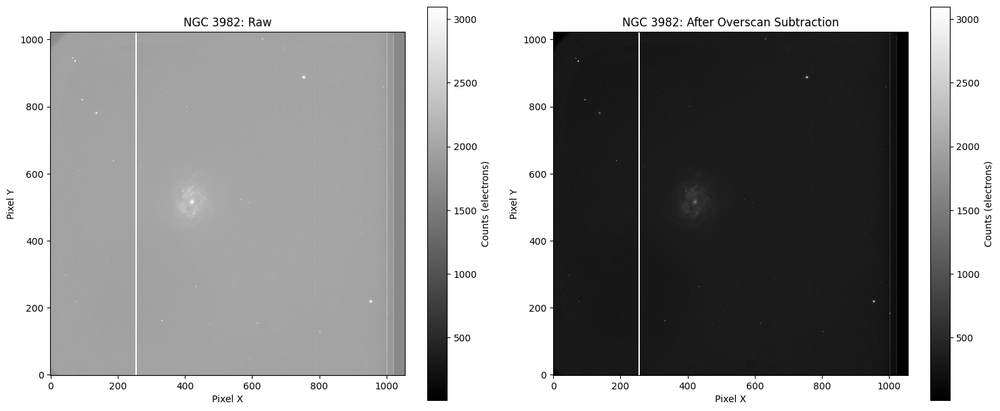

In [75]:

d_l = [ccd, ccd_osub]
t_l = ['NGC 3982: Raw', 'NGC 3982: After Overscan Subtraction']
fits_plot_multi(d_l, titles=t_l,
                    xlabel='Pixel X', ylabel='Pixel Y',
                    cmap='gray', cbar_label='Counts (electrons)',
                    vmin=1, vmax=99.9, ncols=2, figsize=(15, 10), share_axes=False, share_vminmax=True)


In comparing the raw image to the overscan subtracted and trimmed image, we notice one main difference – the counts are lower in every pixel of the oscan subtracted image. This validates our understanding of overscan subtraction, as all we're doing in this step is subtracting the average count value of the overscan region from the science portion of the raw image.

Now let's look at the effects of trimming the image.


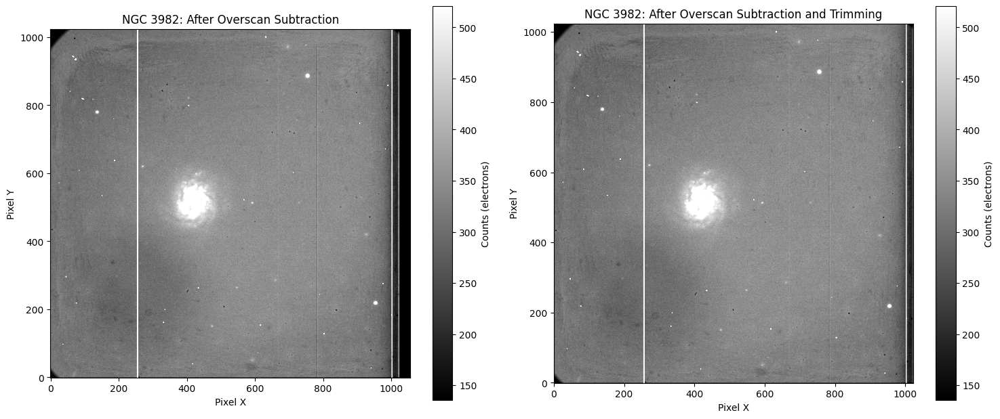

In [76]:
d_l = [ccd_osub, ccd_trim]
t_l = ['NGC 3982: After Overscan Subtraction', 'NGC 3982: After Overscan Subtraction and Trimming']
fits_plot_multi(d_l, titles=t_l,
                    xlabel='Pixel X', ylabel='Pixel Y',
                    cmap='gray', cbar_label='Counts (electrons)', ncols=2, figsize=(15, 10), share_axes=False, share_vminmax=True,
                    scale='zscale')


And here we notice the only change that happened over the trimming step was that the overscan region (rightmost 32 columns) were trimmed from the image.

Now let's deal with bias.


## 3.) Bias
Bias refers to the constant electronic offset that is added to every CCD exposure during the readout process. This offset ensures that no pixel values fall below zero, but it also introduces a baseline level of signal that does not originate from any astronomical source.

To measure this bias, astronomers take zero-second exposures, known as bias frames, which capture only this inherent electronic noise. By averaging several bias frames, a master bias is created and then subtracted from each science image. This subtraction removes the baseline electronic offset, ensuring that subsequent analyses reflect only the true light signal. Proper bias correction is a critical first step before applying further calibrations such as dark subtraction and flat-fielding.


In [77]:
metadata[metadata['frametype'] == 'bias']


file,frametype,object,filter,exptime,airmass,ra,dec,xbin,ybin,mode
str32,str32,str32,str32,str32,str32,str32,str32,str32,str32,str32
d1017.fits,bias,Bias,I,0,1.35322701931,14:24:55.11,-5:06:19.9,-2,-2,80
d1018.fits,bias,Bias,I,0,1.35322701931,14:25:45.28,-5:06:20.9,-2,-2,80
d1019.fits,bias,Bias,I,0,1.35322701931,14:26:15.35,-5:06:21.5,-2,-2,80
d1020.fits,bias,Bias,I,0,1.35322701931,14:26:50.59,-5:06:22.3,-2,-2,80
d1021.fits,bias,Bias,I,0,1.35322701931,14:27:20.67,-5:06:22.9,-2,-2,80
d1022.fits,bias,Bias,I,0,1.35322701931,14:27:50.86,-5:06:23.5,-2,-2,80
d1023.fits,bias,Bias,I,0,1.35322701931,14:28:25.99,-5:06:24.2,-2,-2,80
d1024.fits,bias,Bias,I,0,1.35322701931,14:28:56.06,-5:06:24.9,-2,-2,80
d1025.fits,bias,Bias,I,0,1.35322701931,14:29:31.19,-5:06:25.6,-2,-2,80


By looking at our metadata, we can see that there are 10 bias images in this raw image set from Nickel.

First, let's take a quick glance at the bias images.


In [78]:
indx = metadata['frametype'] == 'bias'
nbias = np.sum(indx)

bias_frames = dir_nav.frame_path(metadata, select=indx, path_key='rawdir')


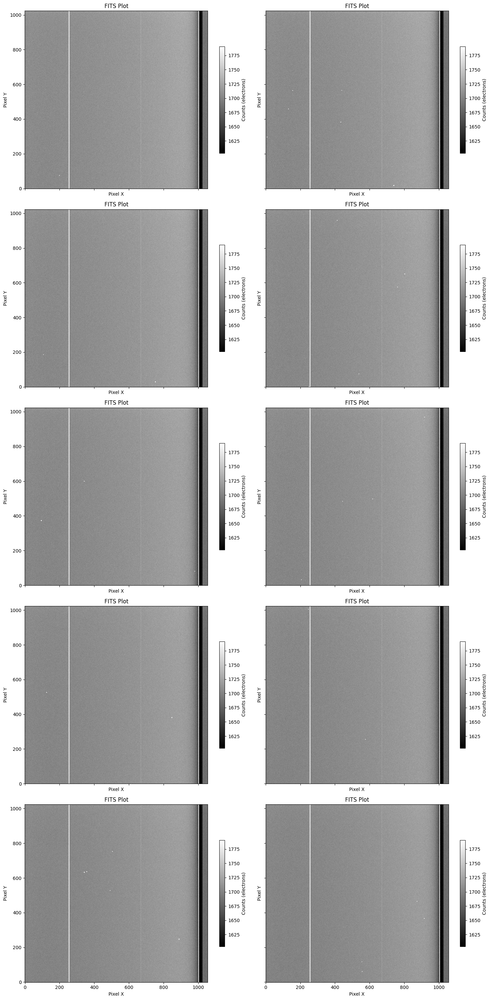

In [79]:
# d_l = [ccd_osub, ccd_trim]
# t_l = ['NGC 3982: After Overscan Subtraction', 'NGC 3982: After Overscan Subtraction and Trimming']
fits_plot_multi(bias_frames, titles=None,
                    xlabel='Pixel X', ylabel='Pixel Y',
                    cmap='gray', cbar_label='Counts (electrons)', ncols=2, figsize=(15, 30), share_vminmax=True)


In observing the bias frames, we can notice a few things. 

1. The major imperfections (blank columns, dark columns, etc) are unvarying across the bias frames
2. In each bias frame there are a number of random pixels that are oversaturated

These random dots are typically transient noise events—such as cosmic ray hits or electronic glitches—that occur during the CCD readout. Even in zero-second bias exposures, the readout process can sometimes record these impulsive events, which vary in position from one bias frame to the next. To minimize their impact, it's common practice to combine several bias frames (for example, using a median) so that these outliers are rejected in the final master bias.

And that is exactly what we will do next!

Our super bias function, *reduction.get_super_bias()*, performs iterative sigma clipping ($ \sigma = 5 $) on each bias frame, then combines each sigma clipped bias frame into an average to create the master bias frame. 

Let's create the super bias, then plot it.

In [80]:
from pipnick.pipelines.reduction import get_super_bias

super_bias = get_super_bias(metadata)

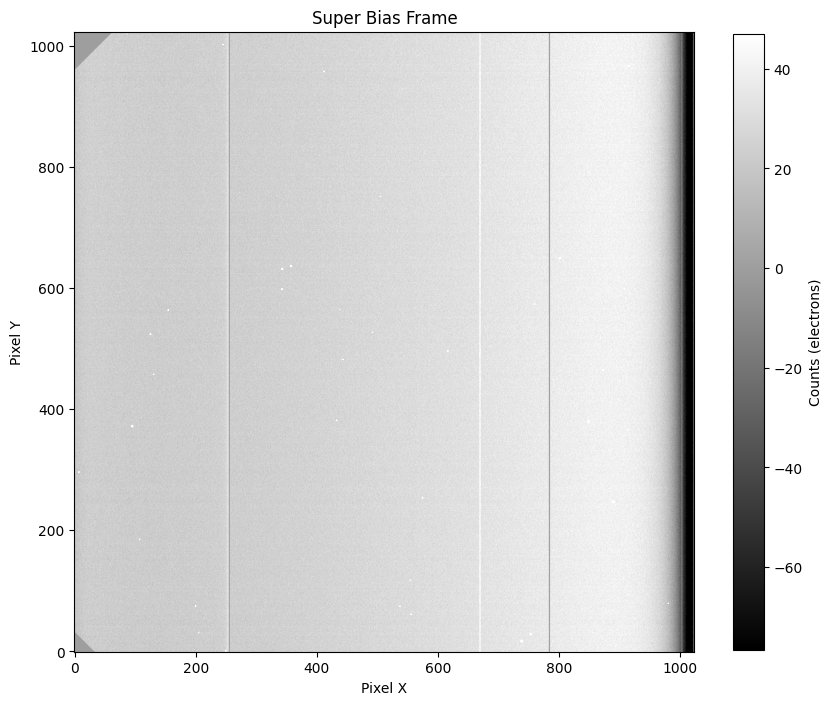

In [81]:
fits_plot(super_bias, title='Super Bias Frame',
          xlabel='Pixel X', ylabel='Pixel Y', cmap='gray', cbar_label='Counts (electrons)',
          figsize=(10, 10))


We then simply subtract the super bias from the overscan subtracted and trimmed image.

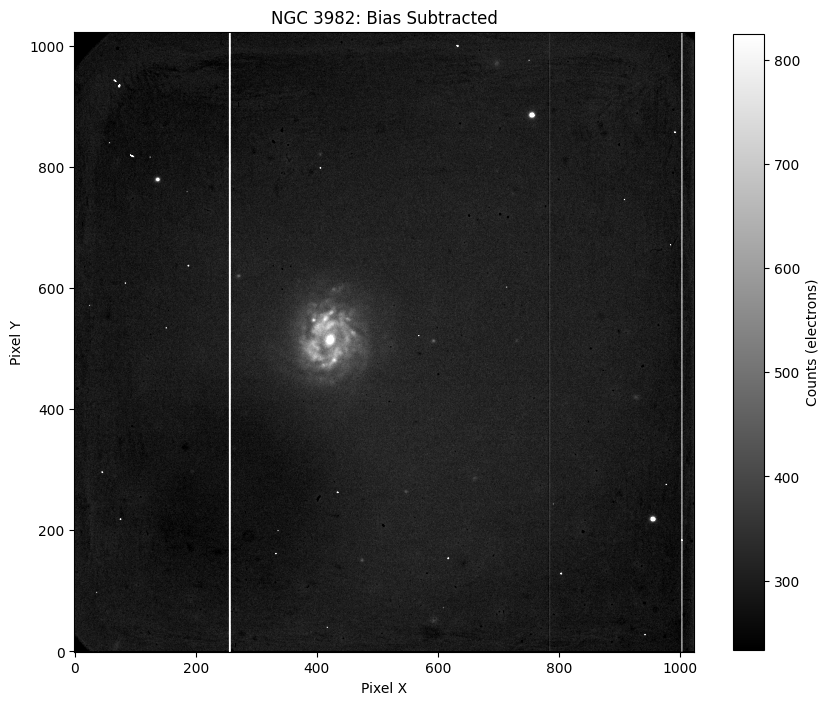

In [82]:
ccd_bias = ccdproc.subtract_bias(ccd_trim, super_bias)

fits_plot(ccd_bias, title='NGC 3982: Bias Subtracted',
          xlabel='Pixel X', ylabel='Pixel Y', cmap='gray', cbar_label='Counts (electrons)',
          figsize=(10, 10))


Let's compare how the image changes after the bias subtraction step.

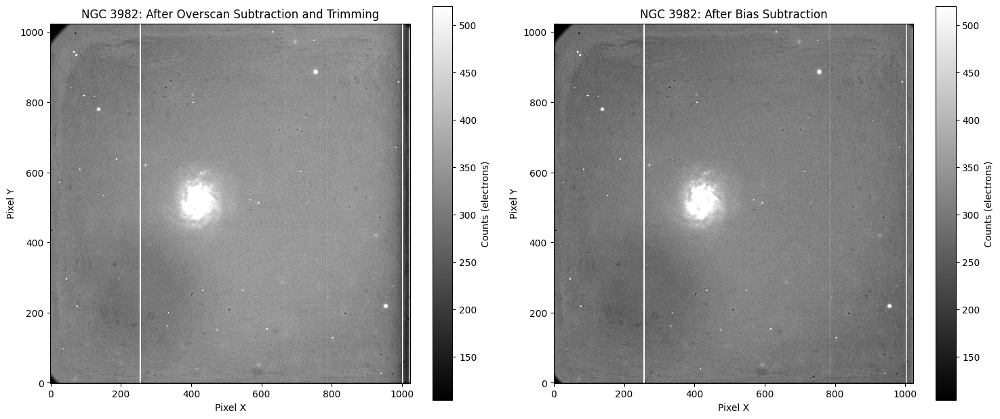

In [83]:
d_l = [ccd_trim, ccd_bias]
t_l = ['NGC 3982: After Overscan Subtraction and Trimming', 'NGC 3982: After Bias Subtraction']
fits_plot_multi(d_l, titles=t_l,
                    xlabel='Pixel X', ylabel='Pixel Y',
                    cmap='gray', cbar_label='Counts (electrons)', ncols=2, figsize=(15, 10), share_axes=False, share_vminmax=True, scale='zscale')


In comparing the image before and after bias subtraction, the changes are more subtle. 

From a standard CCD‐reduction perspective, the main difference is that after overscan subtraction and trimming, you have removed the overscan region and its row‐to‐row electronic offset but you still retain any overall bias level in the image. Once you perform the bias subtraction (using a master bias frame or a representative bias level), you remove that remaining additive offset.

In practical terms, you can see that in the second image (after bias subtraction), the background level is more uniform and closer to zero across the entire field. This is most obvious in the columns on the far right. This typically improves contrast in faint regions and makes the true sky background more accurate, while leaving the galaxy structure and star brightnesses more clearly defined.

At this point, we can move onto the next phase of image reduction – flats.

## 4.) Flat Field Correction



Flat field correction is a calibration step designed to remove variations in pixel sensitivity and optical artifacts from CCD images. By taking images of a uniformly illuminated source—such as a twilight sky or a specialized flat field lamp—we obtain a map of how the detector responds unevenly across its surface. This flat field image is then normalized and used to divide the science image, effectively correcting for imperfections like dust on the optics, vignetting, or inherent pixel-to-pixel response differences. The result is an image where the brightness accurately represents the observed scene, free from the instrumental signatures that could otherwise compromise the data.

In [84]:
metadata[metadata['object'] == 'Flat']

file,frametype,object,filter,exptime,airmass,ra,dec,xbin,ybin,mode
str32,str32,str32,str32,str32,str32,str32,str32,str32,str32,str32
d1001.fits,skyflat,Flat,B,3,1.35322701931,14:01:59.45,-5:05:53.4,-2,-2,80
d1002.fits,skyflat,Flat,B,3,1.35322701931,14:02:39.62,-5:05:54.1,-2,-2,80
d1003.fits,skyflat,Flat,B,3,1.35322701931,14:03:24.73,-5:05:54.9,-2,-2,80
d1004.fits,skyflat,Flat,B,3,1.35322701931,14:04:04.91,-5:05:55.7,-2,-2,80
d1005.fits,skyflat,Flat,V,3,1.35322701931,14:04:55.19,-5:05:56.6,-2,-2,80
d1006.fits,skyflat,Flat,V,7,1.35322701931,14:06:05.44,-5:05:57.8,-2,-2,80
d1007.fits,skyflat,Flat,V,7,1.35322701931,14:06:55.61,-5:05:58.8,-2,-2,80
d1008.fits,skyflat,Flat,V,7,1.35322701931,14:07:45.89,-5:05:59.7,-2,-2,80
d1009.fits,skyflat,Flat,R,7,1.35322701931,14:08:46.03,-5:06:00.8,-2,-2,80


In this example dataset, there are 16 flats, all of type *skyflat*. There are 4 flat frames for each filter band, some with varying exposure times. 

Let's plot some of these flat frames.

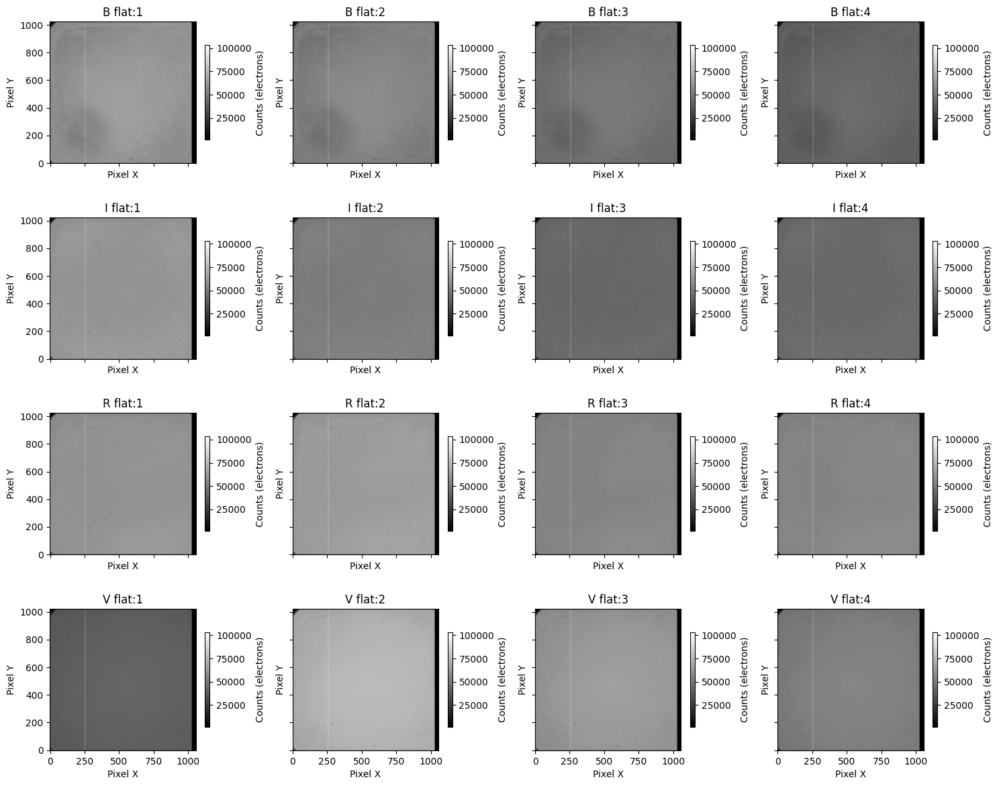

In [95]:
# Select skyflat frames
indx = metadata['frametype'] == 'skyflat'

# Retrieve flat frame paths
flat_frames = dir_nav.frame_path(metadata, select=indx, path_key='rawdir')

# Get the corresponding filter names using bracket indexing (for an Astropy Table)
flat_filters = np.array(metadata[indx]['filter'])

# Group (or sort) the frames by filter so that flats of the same filter are together.
# Create a list of (frame, filter) tuples and sort by the filter value.
flat_tuples = list(zip(flat_frames, flat_filters))
flat_tuples_sorted = sorted(flat_tuples, key=lambda x: x[1])
sorted_flat_frames, sorted_filters = zip(*flat_tuples_sorted)

# Create a titles list so that the first plot in each row (of 4) shows the filter name.
titles = []
ncols = 4  # 4 plots per row
for i in range(0, len(sorted_flat_frames), ncols):
    # All frames in this row should have the same filter (after sorting).
    current_filter = sorted_filters[i]
    for j in range(ncols):
        titles.append(f"{current_filter} flat:{j+1}")

# Plot with 4 rows and 4 columns (subplot_dims=[4,4])
fits_plot_multi(sorted_flat_frames, titles=titles,
                xlabel='Pixel X', ylabel='Pixel Y',
                cmap='gray', cbar_label='Counts (electrons)',
                ncols=ncols, figsize=(15, 12), share_vminmax=True,
                subplot_dims=[4, 4])


We can see there is some variation, but also some constants across these flats.

In the pipnick reduction pipeline, we use the helper function *reduction.get_super_flats*. 

This function creates a "super flat" by combining multiple individual flat field frames for each filter. Here's how it works:

1. **Frame Selection:**  
   It first filters the metadata table to select only those frames that match the specified flat type (either skyflats or domeflats). If no frames are found, it logs a warning and exits.

2. **Filter Determination:**  
   It then identifies which filters to process. If no specific filter list is provided, it uses all unique filters found among the selected flat frames.

3. **File Handling:**  
   If a save directory is given, the function checks for an existing super flat file for each filter. If the file exists and the overwrite option is not enabled, it loads the pre-combined super flat instead of reprocessing the flats.

4. **Combining Flats:**  
   For each filter, the function collects the file paths for the individual flat frames and calls a helper function (`stack_frames`). This routine stacks the individual flats—applying scaling and bias subtraction as needed—to produce a combined (super) flat frame for that filter.

5. **Saving and Returning:**  
   Once created, if a save directory was provided, the new super flat is written to disk with a header updated to indicate its type (e.g., "SkyFlat" or "DomeFlat"). Finally, a dictionary mapping each filter to its corresponding super flat CCDData object is returned.

This process ensures that each filter has a robust flat field correction frame, which helps remove pixel-to-pixel sensitivity variations and optical artifacts from the science images.

In [96]:
from pipnick.pipelines.reduction import get_super_flats

super_flats = get_super_flats(metadata, save_dir=metadata.meta['rdxdir'],
                             flattype='skyflat', bias=super_bias, overwrite=True)

# Since we know our science image for NGC 3982 uses a B filter, we'll use that one from the super_flats object.
b_super_flat = super_flats['B']

Let's observe the B filter super flat.

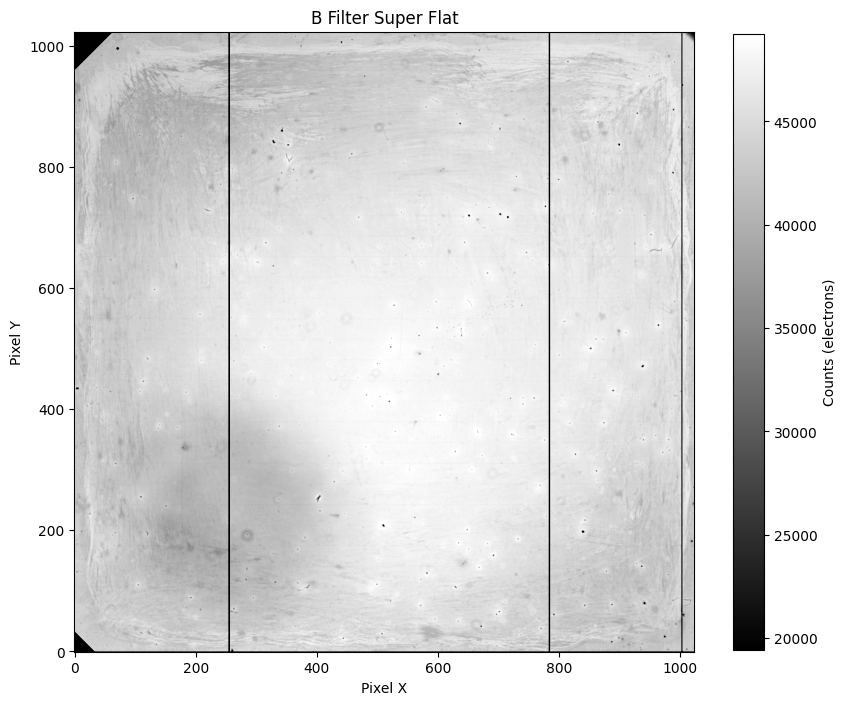

In [97]:
fits_plot(b_super_flat, title='B Filter Super Flat',
          xlabel='Pixel X', ylabel='Pixel Y', cmap='gray', cbar_label='Counts (electrons)',
          figsize=(10, 10))


Here we can see all of the optical artifacts (dust, scratches, vertical lines). 

Also notice how high the counts are – this intuitively makes sense because the flats have such long exposure times.

Now let's perform flat correction using this B filter super flat. The pipnick reduction pipeline depends on the *ccdproc.flat_correct()* method, which divides the science image by the normalized super flat.

In [98]:
ccd_flat = ccdproc.flat_correct(ccd_bias, b_super_flat)

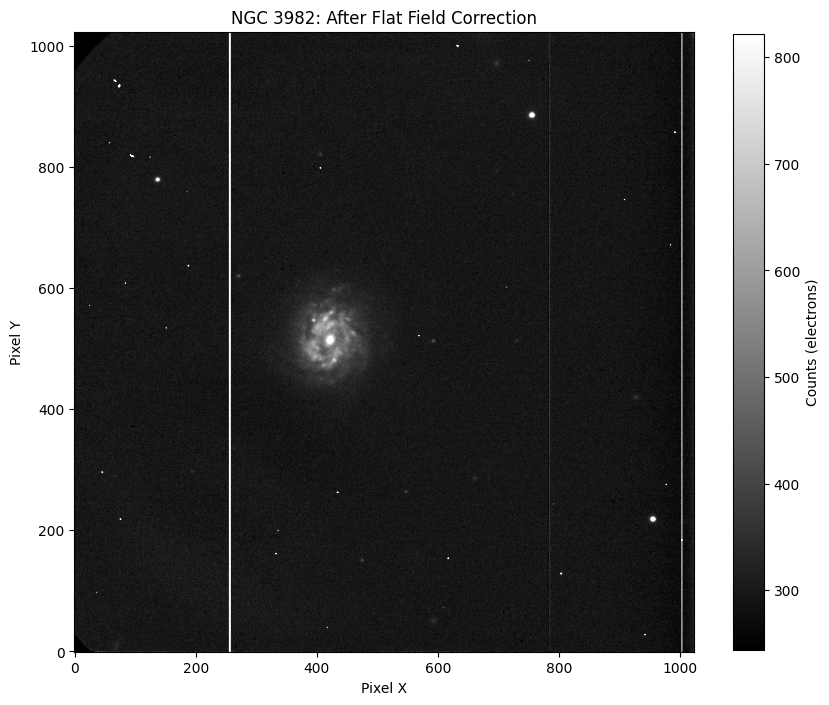

In [99]:
fits_plot(ccd_flat, title='NGC 3982: After Flat Field Correction',
          xlabel='Pixel X', ylabel='Pixel Y', cmap='gray', cbar_label='Counts (electrons)',
          figsize=(10, 10))


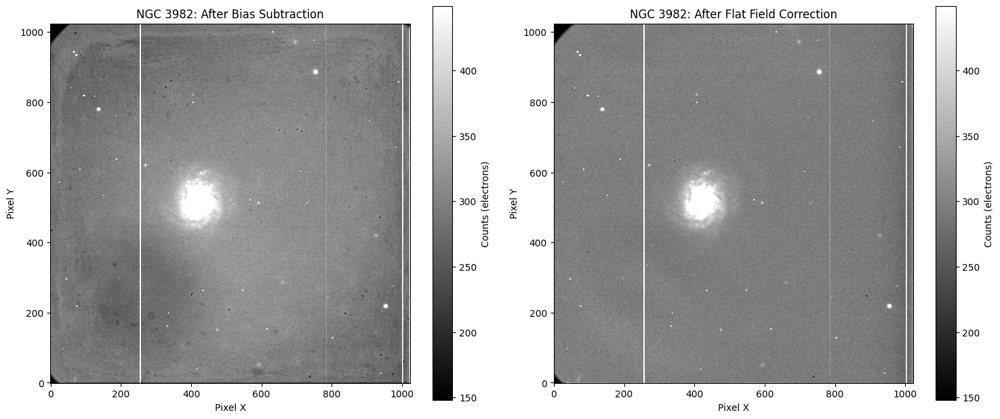

In [101]:
d_l = [ccd_bias, ccd_flat]
t_l = ['NGC 3982: After Bias Subtraction', 'NGC 3982: After Flat Field Correction']
fits_plot_multi(d_l, titles=t_l,
                    xlabel='Pixel X', ylabel='Pixel Y',
                    cmap='gray', cbar_label='Counts (electrons)', ncols=2, figsize=(15, 10), share_axes=False, share_vminmax=True, scale='zscale')


In comparing the image before and after flat field correction, the most noticable change is in the uniformity of the dark sky background. Where there was fading and vignetting before, now the image background is fairly uniform.

We now move on to our next and final step, cosmic ray removal.

## 5.) Cosmic Ray Removal 

Our processed science image looks pretty good now, execpt for those sharp overexpsed pixels blips. Those are caused by cosmic rays and machine errors, the removal of which contitutes the final step in the reduction process.

Cosmic rays are high-energy particles that strike the CCD detector, producing bright, isolated spots or streaks that do not originate from the astronomical target. Their random and transient nature means that each image may contain different cosmic ray artifacts. Specialized algorithms detect these anomalously high pixel values—often by comparing local pixel intensities to their surroundings—and then flag and correct them, typically by replacing the affected pixels with interpolated values from neighboring regions. This cosmic ray removal process is essential to ensure that the final image accurately represents the true light signal, thereby preserving the integrity of the subsequent scientific analyses.

In [102]:
# Get readnoise from header meta (default to 5.0 electrons if not present)
readnoise = ccd.meta.get('PROCRN', 5.0)

# Remove cosmic rays
ccd_final = ccdproc.cosmicray_lacosmic(ccd_flat, gain_apply=False, gain=1.0, readnoise=readnoise, verbose=True)

Starting 4 L.A.Cosmic iterations
Iteration 1:
227 cosmic pixels this iteration
Iteration 2:
30 cosmic pixels this iteration
Iteration 3:
13 cosmic pixels this iteration
Iteration 4:
15 cosmic pixels this iteration


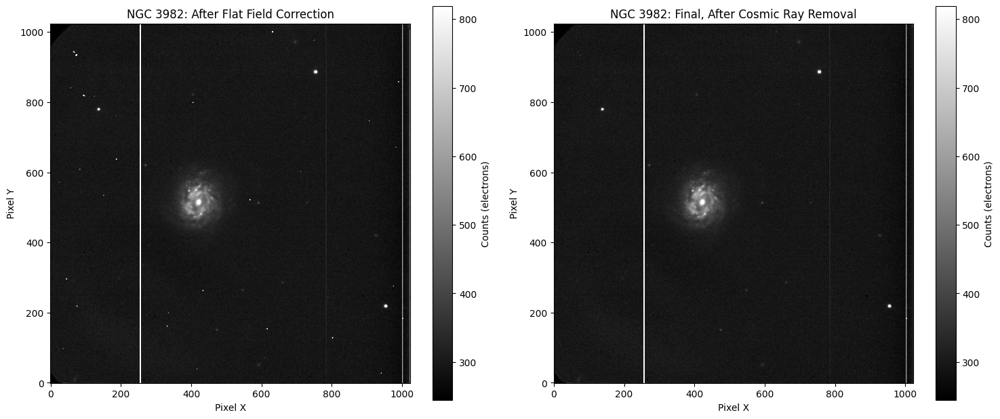

In [106]:
d_l = [ccd_flat, ccd_final]
t_l = ['NGC 3982: After Flat Field Correction', 'NGC 3982: Final, After Cosmic Ray Removal']
fits_plot_multi(d_l, titles=t_l,
                    xlabel='Pixel X', ylabel='Pixel Y',
                    cmap='gray', cbar_label='Counts (electrons)', ncols=2, figsize=(15, 10), share_axes=False, share_vminmax=True)


And tada – all the sharp overexposed pixel blips are gone! All that remains are the large vertical bars and the corners missing data, the pixels of which are masked in the *ccd.mask* attribute.

In [107]:
ccd_final.mask

array([[ True,  True,  True, ..., False, False, False],
       [ True,  True,  True, ..., False, False,  True],
       [ True,  True,  True, ..., False, False,  True],
       ...,
       [ True,  True,  True, ..., False, False, False],
       [ True,  True,  True, ..., False, False, False],
       [ True,  True,  True, ..., False, False, False]])

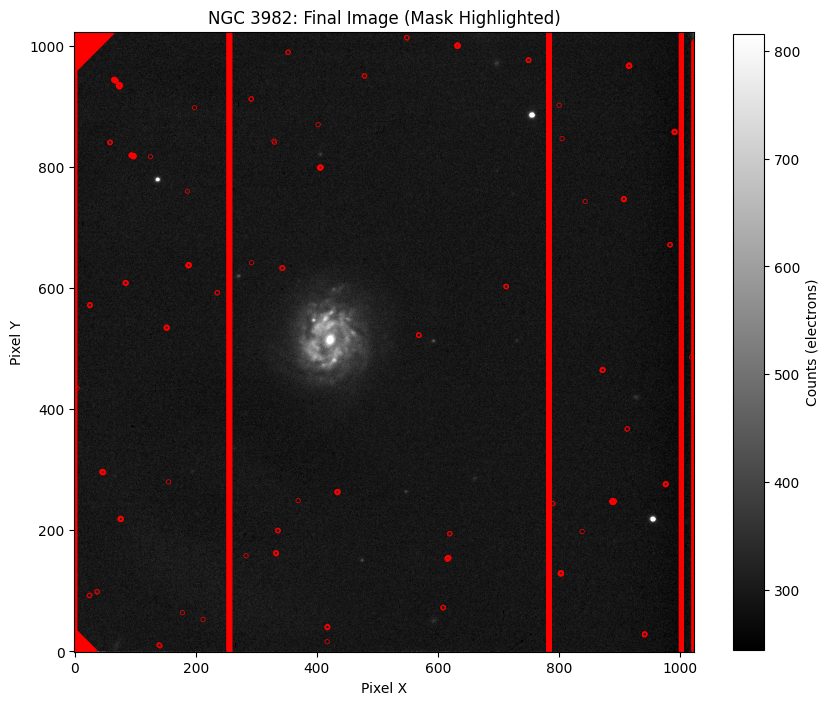

In [108]:
fits_plot(ccd_final, title='NGC 3982: Final Image (Mask Highlighted)', mask_highlight=True,
              xlabel='Pixel X', ylabel='Pixel Y', cmap='gray', cbar_label='Counts (electrons)',
              vmin=1, vmax=99.75, figsize=(10, 10))

And that's that for reduction! The next step in the pipeline image processing is astrometry.